In [1]:
using Revise
using Distributions
using LinearAlgebra
using ColorSchemes
using Plots
default(label="", guidefontsize=18, tickfontsize=12, legendfontsize=18, margin=10Plots.pt)

includet("../FreeEnergyAgents.jl"); using. FreeEnergyAgents
includet("../util.jl")

In [36]:
# Nonlinear observation
g(x::AbstractVector) = [sqrt(x[1]^2 + x[2]^2), atan(x[2],x[1])]

# Measurement noise
R = 1e-8diagm(ones(2));

In [37]:
# Distribution around goal state
z_star = [0., 0.5, 0., 0.]
goal = (g(z_star), diagm(ones(2)))

([0.5, 1.5707963267948966], [1.0 0.0; 0.0 1.0])

In [43]:
function helper0(x,y; D=2, R=diagm(ones(2)), S_t=diagm(ones(2)))

    μ, Σ, Γ = ET1([x; y], S_t, g, addmatrix=R, forceHermitian=true)
    return risk(μ,Σ, goal) + ambiguity(Σ,Γ, S_t)

end

function helper1(x,y; D=2, R=diagm(ones(2)), S_t=diagm(ones(2)))

    μ, Σ, Γ = ET2([x; y], S_t, g, addmatrix=R, forceHermitian=true)
    return risk(μ,Σ, goal)

end

function helper2(x,y; D=2, R=diagm(ones(2)), S_t=diagm(ones(2)))

    μ, Σ, Γ = ET2([x; y], S_t, g, addmatrix=R, forceHermitian=true)
    return risk(μ,Σ, goal) + ambiguity(Σ,Γ, S_t)

end

helper2 (generic function with 1 method)

In [44]:
Nr = 200
xr = range(-2, stop=2, length=Nr)
yr = range(-2, stop=2, length=Nr)

-2.0:0.020100502512562814:2.0

In [45]:
EFEg0 = zeros(Nr,Nr)
for (ii,x) in enumerate(xr)
    for (jj,y) in enumerate(yr)
        EFEg0[ii,jj] = helper0(x,y, R=R, S_t=diagm(ones(2)))
    end
end
ming0 = argmin(EFEg0)

CartesianIndex(100, 144)

In [46]:
EFEg1 = zeros(Nr,Nr)
for (ii,x) in enumerate(xr)
    for (jj,y) in enumerate(yr)
        EFEg1[ii,jj] = helper1(x,y, R=R, S_t=diagm(ones(2)))
    end
end
ming1 = argmin(EFEg1)

CartesianIndex(101, 156)

In [47]:
EFEg2 = zeros(Nr,Nr)
for (ii,x) in enumerate(xr)
    for (jj,y) in enumerate(yr)
        EFEg2[ii,jj] = helper2(x,y, R=R, S_t=diagm(ones(2)))
    end
end
EFEg2
ming2 = argmin(EFEg2)

CartesianIndex(101, 188)

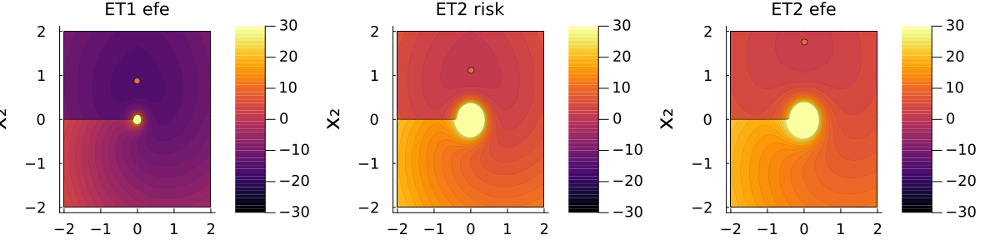

In [53]:
p1 = contourf(xr,yr, (xr,yr) -> helper0(xr,yr; R=R), nlevels=50, title="ET1 efe", linewidth=0, clims=(-30.,30.),xlabel="x₁", ylabel="x₂")
scatter!([xr[ming0[1]]], [yr[ming0[2]]])
p2 = contourf(xr,yr, (xr,yr) -> helper1(xr,yr; R=R), nlevels=50, title="ET2 risk", linewidth=0, clims=(-30.,30.),xlabel="x₁", ylabel="x₂")
scatter!([xr[ming1[1]]], [yr[ming1[2]]])
p3 = contourf(xr,yr, (xr,yr) -> helper2(xr,yr; R=R), nlevels=50, title="ET2 efe", linewidth=0, clims=(-30.,30.),xlabel="x₁", ylabel="x₂")
scatter!([xr[ming2[1]]], [yr[ming2[2]]])
plot(p1,p2,p3, layout=(1,3), size=(1200,300))

In [54]:
savefig("figures/cart2polar-ambiguity-contourf.png")

"c:\\Syndr\\Wouter\\Onderzoek\\Projecten\\tue\\efe-planning\\IWAI2024-ambiguity\\demonstrations\\figures\\cart2polar-ambiguity-contourf.png"

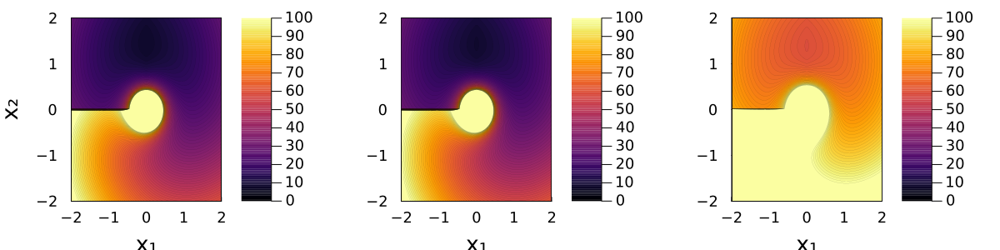

In [12]:
p31 = contourf(xr,yr, (xr,yr) -> helper3(xr,yr, R=1e-3diagm(ones(2)), S_t=1e0diagm(ones(2))), clims=(0.,100.), nlevels=100, linewidth=0, xlabel="x₁", ylabel="x₂")
p32 = contourf(xr,yr, (xr,yr) -> helper3(xr,yr, R=1e-1diagm(ones(2)), S_t=1e0diagm(ones(2))), clims=(0.,100.), nlevels=100, linewidth=0, xlabel="x₁")
p33 = contourf(xr,yr, (xr,yr) -> helper3(xr,yr, R=1e1diagm(ones(2)), S_t=1e0diagm(ones(2))), clims=(0.,100.), nlevels=100, linewidth=0, xlabel="x₁")
plot(p31,p32,p33, layout=(1,3), size=(1200,300), bottom_margin=20Plots.pt, left_margin=20Plots.pt)


In [20]:
savefig("figures/cart2polar-ambiguity-contourf-3.png")

"/home/wmkouw/syndr/Wouter/Onderzoek/Projecten/tue/efe-planning/IWAI2024-ambiguity/demonstrations/figures/cart2polar-ambiguity-contourf-3.png"

In [12]:
contourf(xr,yr, (xr,yr) -> helper1(xr,yr, S_t=1e-2diagm(ones(2))), nlevels=100, clims=(0.,30.), linewidth=0, xlabel="x₁", ylabel="x₂", size=(500,400))
savefig("figures/cart2polar-ambiguity-contourf-S1.png")
contourf(xr,yr, (xr,yr) -> helper1(xr,yr, S_t=1e0diagm(ones(2))), nlevels=100, clims=(0.,30.), linewidth=0, xlabel="x₁", size=(500,400))
savefig("figures/cart2polar-ambiguity-contourf-S2.png")
contourf(xr,yr, (xr,yr) -> helper1(xr,yr, S_t=1e2diagm(ones(2))), nlevels=100, clims=(0.,30.), linewidth=0, xlabel="x₁", size=(500,400))
savefig("figures/cart2polar-ambiguity-contourf-S3.png")

"c:\\Syndr\\Wouter\\Onderzoek\\Projecten\\tue\\efe-planning\\IWAI2024-ambiguity\\demonstrations\\figures\\cart2polar-ambiguity-contourf-S3.png"

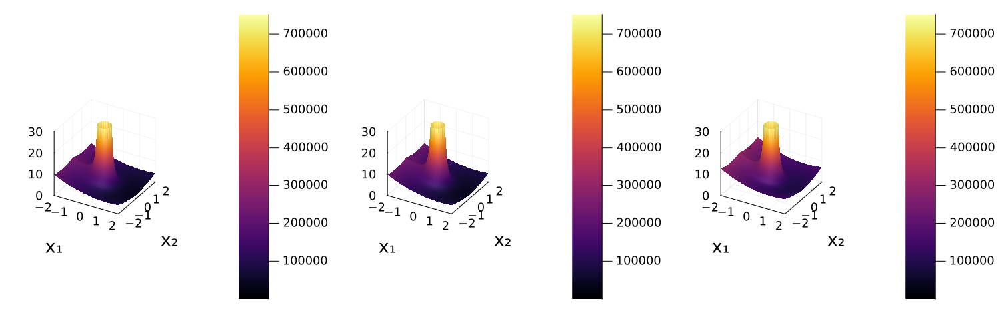

In [14]:
p31 = surface(xr,yr, (xr,yr) -> helper3(xr,yr, R=1e-2diagm(ones(2))), zlims=(0.,30.), nlevels=100, linewidth=0, xlabel="x₁", ylabel="x₂")
p32 = surface(xr,yr, (xr,yr) -> helper3(xr,yr, R=1e-2diagm(ones(2))), zlims=(0.,30.), nlevels=100, linewidth=0, xlabel="x₁", ylabel="x₂")
p33 = surface(xr,yr, (xr,yr) -> helper3(xr,yr, R=1e0diagm(ones(2))), zlims=(0.,30.), nlevels=100, linewidth=0, xlabel="x₁", ylabel="x₂")
plot(p31,p32,p33, layout=(1,3), size=(1500,500))
